In [27]:
!pip install diffusers
!pip install sentence-transformers
!pip install torch
!pip install pot

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [28]:
!pip install opencv-python


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [29]:
!pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [30]:
!pip install accelerate

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [31]:
!pip install tf-keras

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [32]:
!pip install gensim

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [33]:
!pip install ipywidgets --upgrade

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [34]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://download.pytorch.org/whl/cu118



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [35]:
import torch
print(torch.cuda.is_available())  
print(torch.version.cuda)  

True
11.8


In [36]:
from diffusers import DiffusionPipeline, StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
import torch
from PIL import Image
import requests
from io import BytesIO

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sentence_transformers import SentenceTransformer

import os

from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
from IPython.display import display, Image as Image2
import sys
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import requests
import cv2
from sklearn.decomposition import TruncatedSVD

from sklearn.linear_model import LinearRegression
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt
from matplotlib import transforms
import torch
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import chain, combinations
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import wasserstein_distance
from gensim.models import KeyedVectors
from gensim.downloader import load as api_load
from gensim.models import KeyedVectors
from sklearn.metrics.pairwise import euclidean_distances
from scipy.spatial.distance import cdist
from transformers import AutoTokenizer, AutoModel
import torch
import tensorflow as tf
from gensim.models import KeyedVectors
from torch import Generator
import warnings
warnings.filterwarnings('ignore')


In [37]:
import torch
torch.cuda.empty_cache()

In [38]:
#Instruct PIX2PIX
# Initialize the model and pipeline
model_name = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_name, torch_dtype=torch.float16, force_download=True)
device = "cuda"
pipe.to(device)

model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionInstructPix2PixPipeline {
  "_class_name": "StableDiffusionInstructPix2PixPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "timbrooks/instruct-pix2pix",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [39]:
#Dinov2
processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
model = AutoModel.from_pretrained("facebook/dinov2-base")
#Word2Vec model
model_path_bin = r'D:\my project\GoogleNews-vectors-negative300.bin'
model_txt = KeyedVectors.load_word2vec_format(model_path_bin, binary=True)


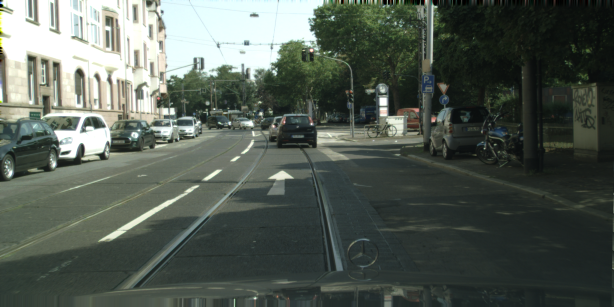

In [40]:
# Load the initial image
url = r"D:\my project\resize30%\1(1).png"
init_image = Image.open(url)
display(init_image)


In [41]:
cfg_image = 7.5 # This controls how much the output should resemble the original image
cfg_text = 1.5 # This controls how much the output should follow the text prompt

In [42]:
prompt = "add rain drop to this image"
words = prompt.split()
words

['add', 'rain', 'drop', 'to', 'this', 'image']

In [43]:
def extract_image_embedding(image, processor, model):
    """Extract embeddings from an image using the DINOv2 model."""
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()
    return embeddings

# Set initial Wasserstein distance to a large number
WD_dist_init = float('inf')

# Path to save generated images on your local system
output_path = "D:\\my project\\stability\\res\\orig.png"


# Repeat generation process until Wasserstein distance is less than 0.1
while WD_dist_init > 0.07:
    # Generate the image
    orig_image = pipe(
        prompt=prompt, 
        image=init_image, 
        cfg_image=cfg_image, 
        cfg_text=cfg_text).images[0]
    
    # Extract embeddings for the original image and initial image
    orig_embedding = extract_image_embedding(orig_image, processor, model)
    init_embedding = extract_image_embedding(init_image, processor, model)
    
    # Calculate Wasserstein distance between the embeddings
    WD_dist_init = wasserstein_distance(orig_embedding, init_embedding)

    print(f'Wasserstein distance: {WD_dist_init}')

    # Save and display the image only if the distance is acceptable
    if WD_dist_init <= 0.07:
        # Save the generated image to the local path
        orig_image.save(output_path)
        print(f"Image saved at: {output_path}")
        
        # Display the image if you're working in an environment where you can visualize it
        # You might need to remove this in VSCode, or use an external viewer
        orig_image.show()

print("Image generation complete with acceptable Wasserstein distance!")


  0%|          | 0/100 [00:00<?, ?it/s]

Wasserstein distance: 0.026230239761692573
Image saved at: D:\my project\stability\res\orig.png
Image generation complete with acceptable Wasserstein distance!


In [44]:
# Set random seeds for reproducibility
seed = 1024
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)  # If using GPU
torch.backends.cudnn.deterministic = True  # Ensure reproducibility for cuDNN
torch.backends.cudnn.benchmark = False  # Disable optimized path for reproducibility
generator = torch.Generator().manual_seed(seed)

def perturb_text(text_list, perturbation, rng):
    # Select words based on the perturbation flag (1 means include)
    perturbed_list_initial = [item for item, flag in zip(text_list, perturbation) if flag == 1 and item.strip() != ""]
    
    # If no words were selected, we force select at least one word
    if len(perturbed_list_initial) < 2:
        additional_words_needed = 2
        available_words = [item for item in text_list if item.strip() != ""]
        additional_words = rng.choice(available_words, additional_words_needed, replace=False)
        perturbed_list = perturbed_list_initial + list(additional_words)
    else:
        perturbed_list = perturbed_list_initial
    
    return perturbed_list

# Assuming `prompt` and other variables are predefined
  # Example prompt
words = prompt.split()
text_list = words.copy()

num_perturb = 30
num_words = len(words)

Responses = []
Perturbations = []
unique_perturbations = set()
rng = np.random.default_rng(seed)

while len(unique_perturbations) < num_perturb:
    # Generate a random perturbation and ensure it selects at least one word
    while True:
        perturbation = tuple(rng.binomial(1, 0.5, size=num_words))  # Random perturbation vector
        if sum(perturbation) > 0:  # Ensure at least one word is selected
            break
    
    # Check for uniqueness
    if perturbation not in unique_perturbations:
        unique_perturbations.add(perturbation)
        perturbed_txt = perturb_text(text_list, perturbation, rng)
        corpus = ' '.join(perturbed_txt)
        Responses.append(corpus)  # Store the unique perturbed text
        Perturbations.append(perturbation)  # Store the perturbation vector
        print(f"Perturbation: {perturbation}, Perturbed Text: {corpus}")


Perturbation: (0, 0, 0, 1, 1, 0), Perturbed Text: to this
Perturbation: (1, 1, 1, 0, 1, 0), Perturbed Text: add rain drop this
Perturbation: (1, 0, 1, 0, 1, 1), Perturbed Text: add drop this image
Perturbation: (0, 1, 1, 1, 0, 0), Perturbed Text: rain drop to
Perturbation: (1, 0, 0, 0, 0, 1), Perturbed Text: add image
Perturbation: (1, 1, 1, 1, 1, 1), Perturbed Text: add rain drop to this image
Perturbation: (0, 0, 1, 0, 0, 0), Perturbed Text: drop to drop
Perturbation: (1, 0, 0, 0, 1, 1), Perturbed Text: add this image
Perturbation: (1, 0, 0, 1, 1, 1), Perturbed Text: add to this image
Perturbation: (1, 0, 1, 1, 1, 0), Perturbed Text: add drop to this
Perturbation: (0, 0, 1, 1, 0, 1), Perturbed Text: drop to image
Perturbation: (0, 0, 0, 0, 0, 1), Perturbed Text: image add drop
Perturbation: (1, 0, 0, 1, 0, 0), Perturbed Text: add to
Perturbation: (1, 0, 1, 1, 1, 1), Perturbed Text: add drop to this image
Perturbation: (1, 1, 0, 0, 1, 1), Perturbed Text: add rain this image
Perturbati

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 1:
Wasserstein distance (generated vs init): 0.026374407379686708
Wasserstein distance (generated vs orig): 0.007206840197037918


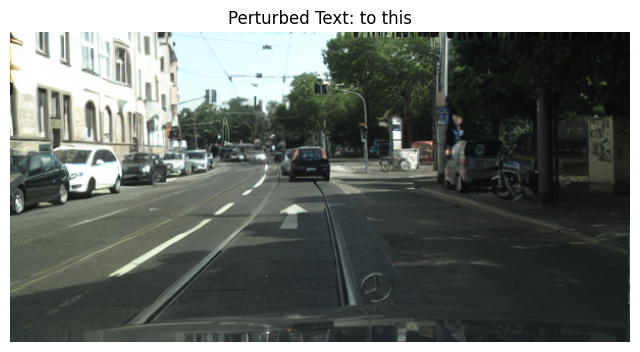

Image generation 1 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 2:
Wasserstein distance (generated vs init): 0.02627168637400245
Wasserstein distance (generated vs orig): 0.015079314113336293


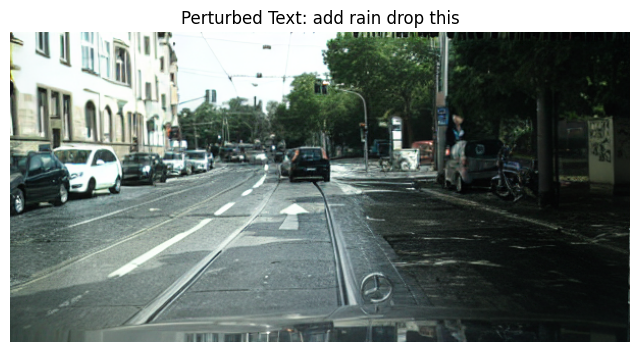

Image generation 2 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 3:
Wasserstein distance (generated vs init): 0.02446671372884643
Wasserstein distance (generated vs orig): 0.009141475732273346


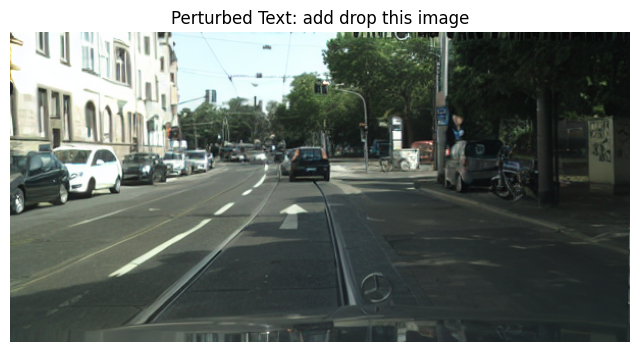

Image generation 3 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 4:
Wasserstein distance (generated vs init): 0.027164902393413605
Wasserstein distance (generated vs orig): 0.021888435608351162


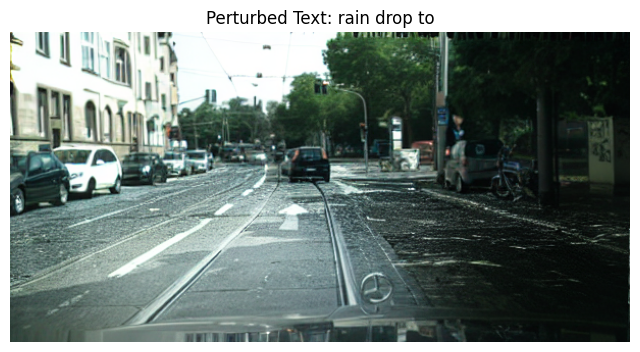

Image generation 4 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 5:
Wasserstein distance (generated vs init): 0.026705391412482057
Wasserstein distance (generated vs orig): 0.007834741749187893


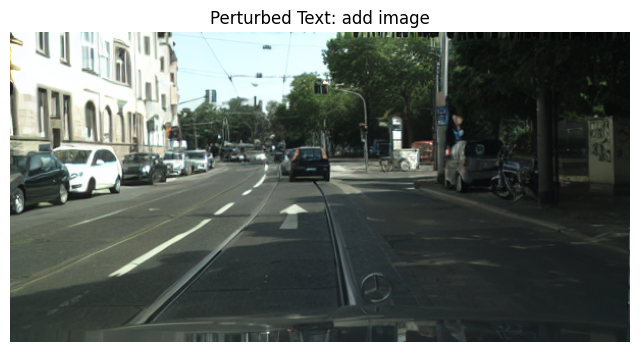

Image generation 5 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 6:
Wasserstein distance (generated vs init): 0.029574505305921168
Wasserstein distance (generated vs orig): 0.021090794974573637


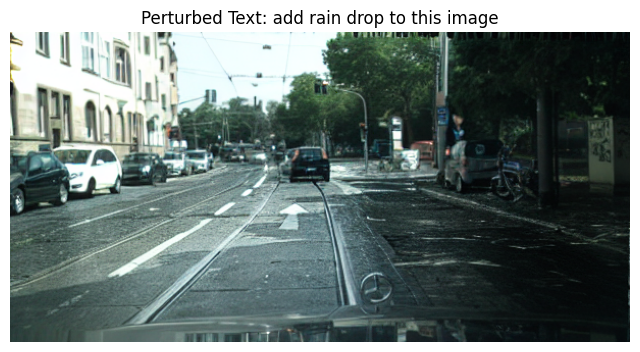

Image generation 6 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 7:
Wasserstein distance (generated vs init): 0.029329699141271696
Wasserstein distance (generated vs orig): 0.01769490170181598


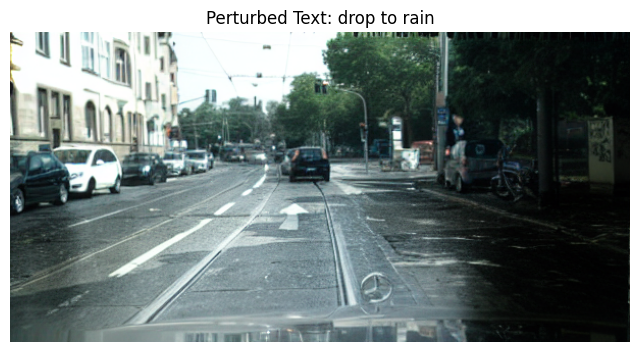

Image generation 7 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 8:
Wasserstein distance (generated vs init): 0.02537187864034727
Wasserstein distance (generated vs orig): 0.008129447745735284


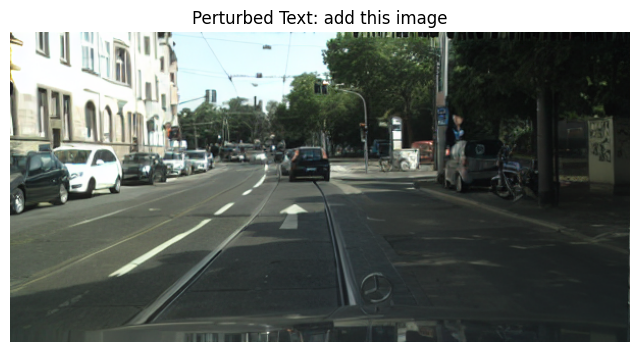

Image generation 8 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 9:
Wasserstein distance (generated vs init): 0.026620672035960545
Wasserstein distance (generated vs orig): 0.00796098956546605


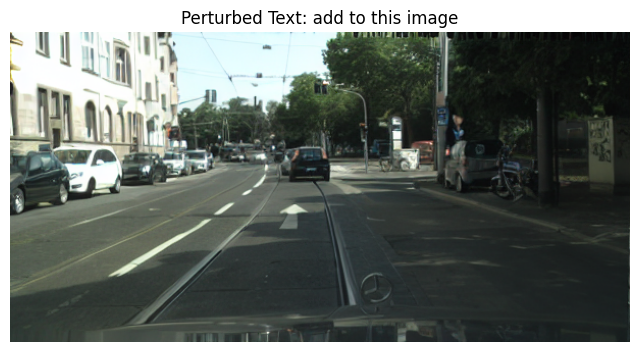

Image generation 9 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 10:
Wasserstein distance (generated vs init): 0.03012112670027515
Wasserstein distance (generated vs orig): 0.008338410010348216


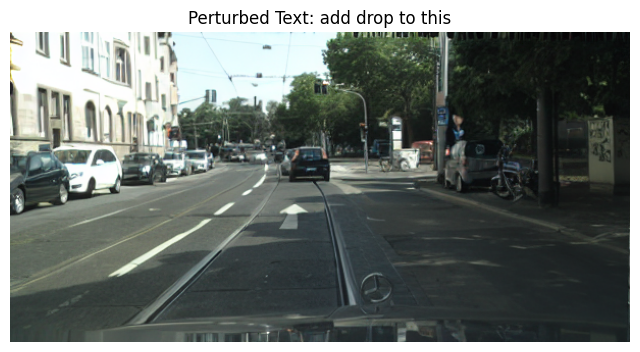

Image generation 10 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 11:
Wasserstein distance (generated vs init): 0.025726026370648483
Wasserstein distance (generated vs orig): 0.03176396191171683


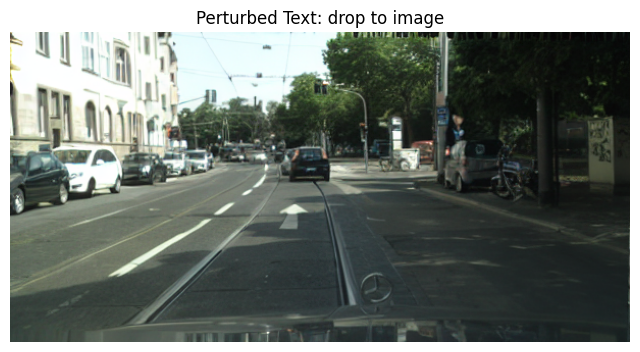

Image generation 11 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 12:
Wasserstein distance (generated vs init): 0.02531035144026344
Wasserstein distance (generated vs orig): 0.008732664418857892


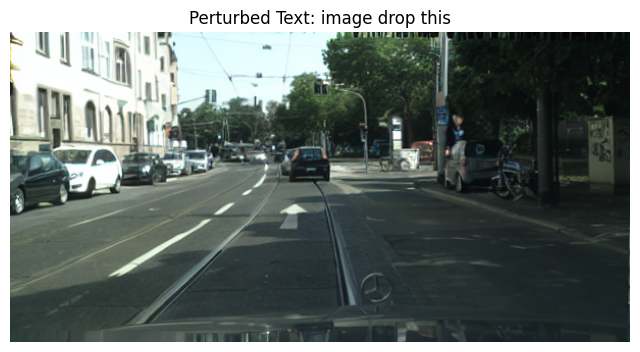

Image generation 12 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 13:
Wasserstein distance (generated vs init): 0.027388283848116174
Wasserstein distance (generated vs orig): 0.007218221227352245


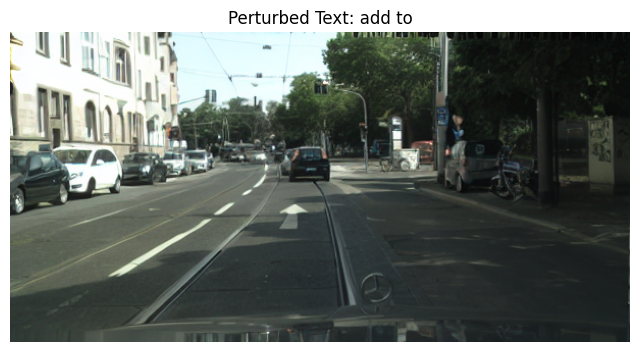

Image generation 13 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 14:
Wasserstein distance (generated vs init): 0.02820911760067209
Wasserstein distance (generated vs orig): 0.024171365829478972


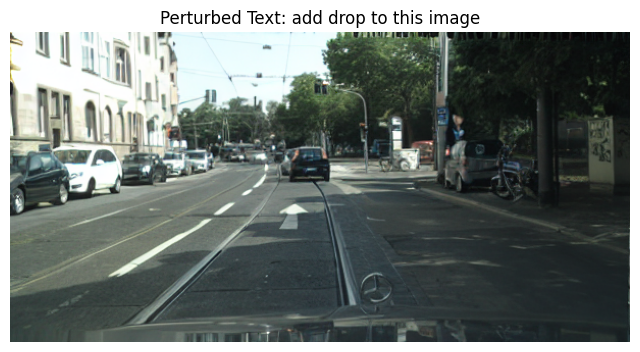

Image generation 14 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 15:
Wasserstein distance (generated vs init): 0.03288196380223478
Wasserstein distance (generated vs orig): 0.03461949912404332


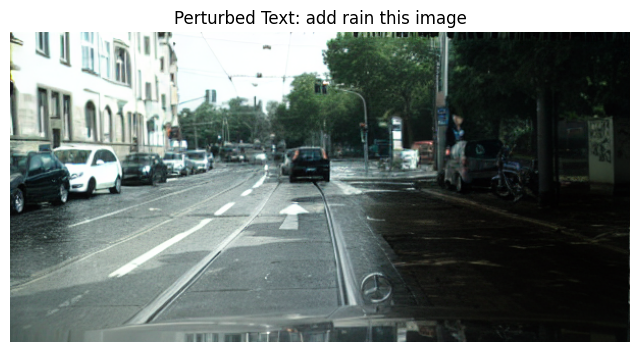

Image generation 15 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 16:
Wasserstein distance (generated vs init): 0.027297003477163656
Wasserstein distance (generated vs orig): 0.01022637917556798


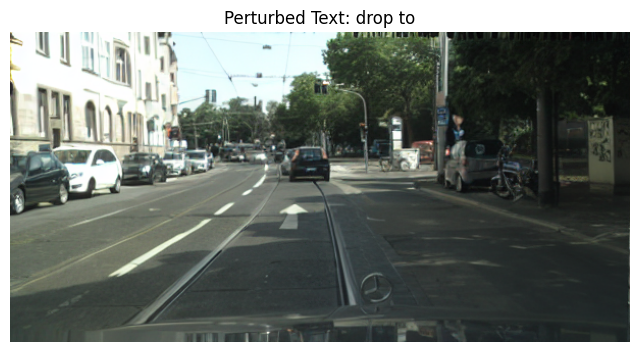

Image generation 16 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 17:
Wasserstein distance (generated vs init): 0.02543619435831111
Wasserstein distance (generated vs orig): 0.007167646355355828


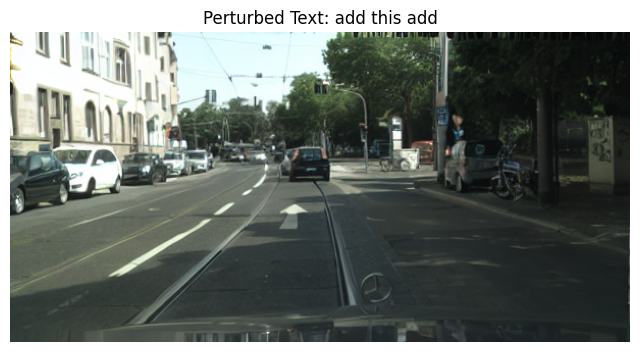

Image generation 17 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 18:
Wasserstein distance (generated vs init): 0.026786467564609975
Wasserstein distance (generated vs orig): 0.01069640108623086


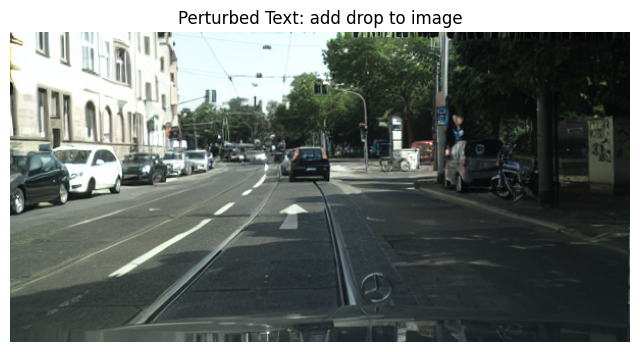

Image generation 18 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 19:
Wasserstein distance (generated vs init): 0.027608601473010218
Wasserstein distance (generated vs orig): 0.019886417055014753


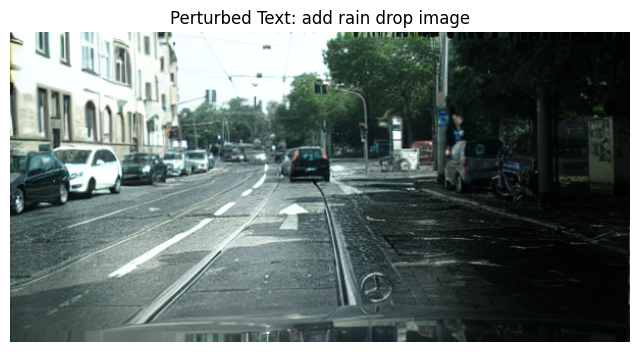

Image generation 19 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 20:
Wasserstein distance (generated vs init): 0.026797077711459387
Wasserstein distance (generated vs orig): 0.007404283354162544


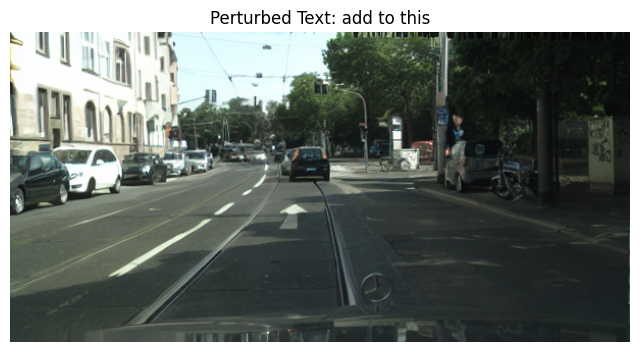

Image generation 20 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 21:
Wasserstein distance (generated vs init): 0.027730078132511448
Wasserstein distance (generated vs orig): 0.0224525292934838


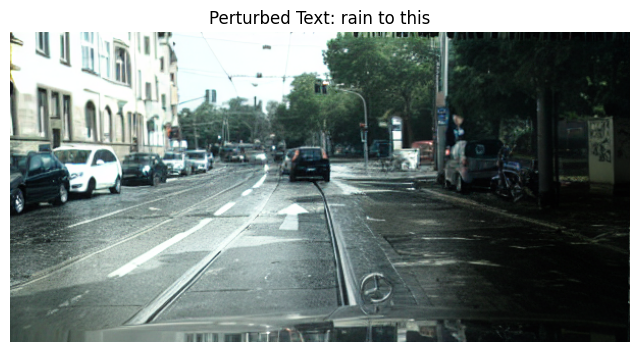

Image generation 21 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 22:
Wasserstein distance (generated vs init): 0.030110804766385033
Wasserstein distance (generated vs orig): 0.01765185175145234


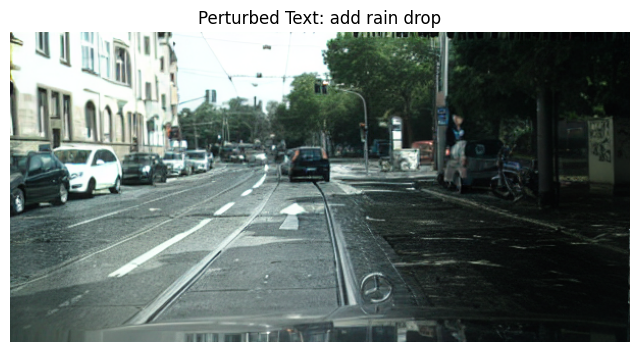

Image generation 22 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 23:
Wasserstein distance (generated vs init): 0.02674803848867668
Wasserstein distance (generated vs orig): 0.017971970709140812


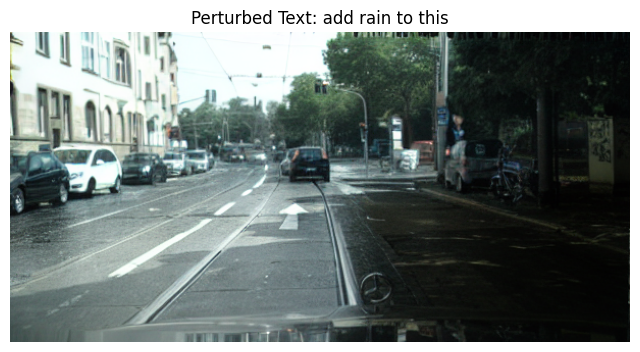

Image generation 23 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 24:
Wasserstein distance (generated vs init): 0.027012346237521953
Wasserstein distance (generated vs orig): 0.00802058192948607


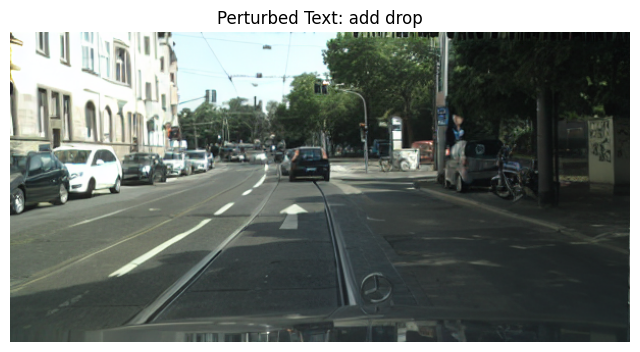

Image generation 24 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 25:
Wasserstein distance (generated vs init): 0.027833632459343498
Wasserstein distance (generated vs orig): 0.019000411576257634


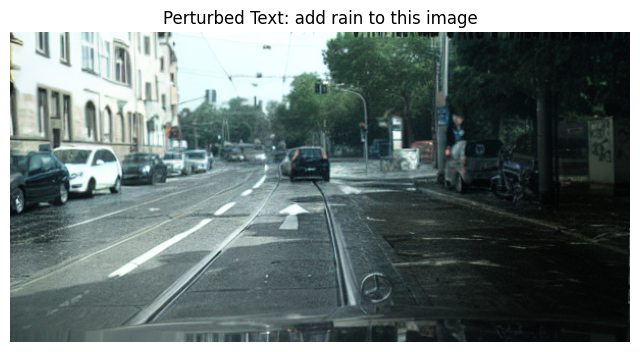

Image generation 25 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 26:
Wasserstein distance (generated vs init): 0.028344633076206556
Wasserstein distance (generated vs orig): 0.02114200482810702


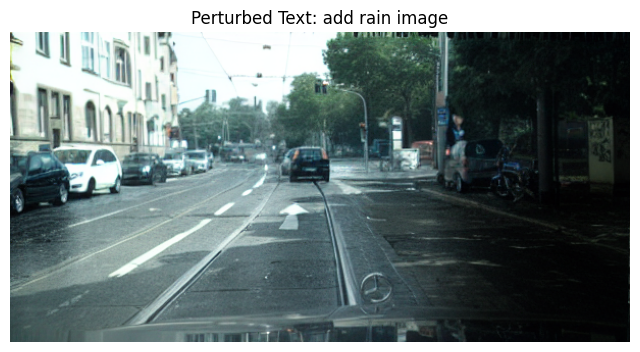

Image generation 26 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 27:
Wasserstein distance (generated vs init): 0.028787446476295976
Wasserstein distance (generated vs orig): 0.020046616667665752


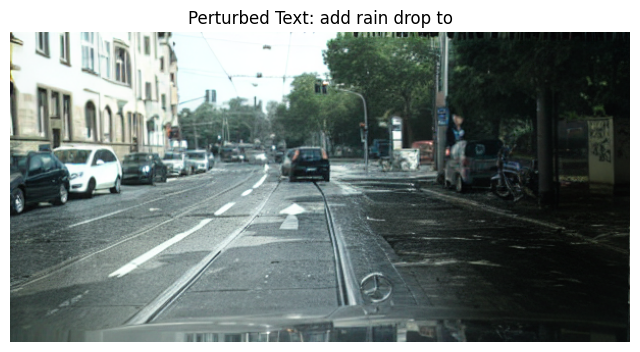

Image generation 27 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 28:
Wasserstein distance (generated vs init): 0.028450327243660933
Wasserstein distance (generated vs orig): 0.023415867929562267


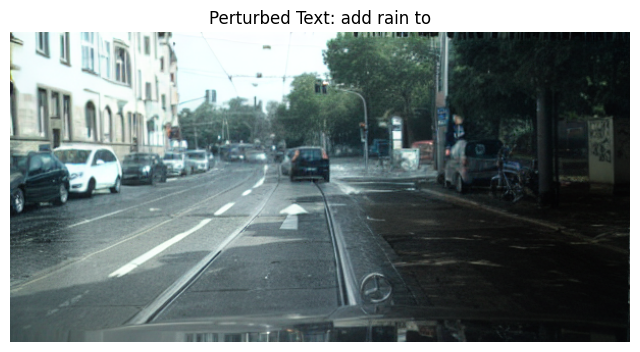

Image generation 28 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 29:
Wasserstein distance (generated vs init): 0.03110914503607393
Wasserstein distance (generated vs orig): 0.016399764323978182


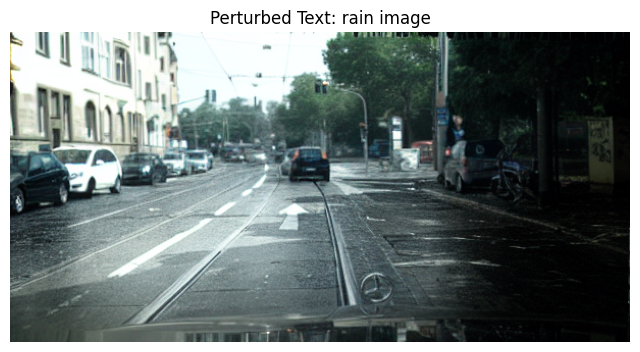

Image generation 29 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 30:
Wasserstein distance (generated vs init): 0.027077197101429355
Wasserstein distance (generated vs orig): 0.006850930444424346


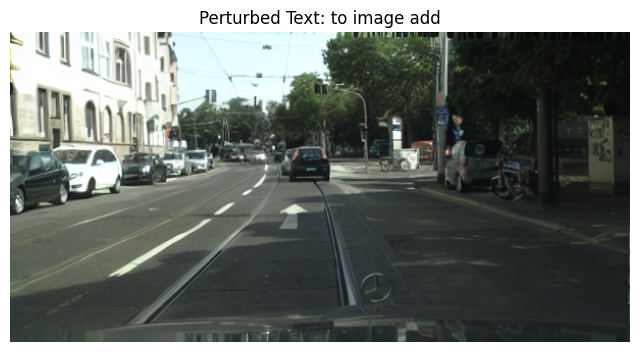

Image generation 30 complete with acceptable Wasserstein distance!


In [45]:
epsilon = 1e-6  # A small value to prevent division by zero
WD_dists_generated_vs_orig = []  # List to store Wasserstein distances

for i, perturbation in enumerate(Perturbations):
    # Generate new text for each perturbation
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    
    # Set initial Wasserstein distances for generated image
    WD_dist_generated = float('inf')
    WD_dist_generated_vs_orig_value = float('inf')  # Distance between generated_image and orig_image (temporarily stored inside the loop)

    # Repeat generation process
    while WD_dist_generated > 0.07:  
        # Generate the original image (once, if not already generated)
        orig_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text).images[0]

        # Generate another image (generated image)
        generated_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text).images[0]

        # Extract embeddings for the generated image, original image, and initial image
        generated_embedding = extract_image_embedding(generated_image, processor, model)
        init_embedding = extract_image_embedding(init_image, processor, model)
        orig_embedding = extract_image_embedding(orig_image, processor, model)

        # Calculate Wasserstein distance between generated image and initial image
        WD_dist_generated = wasserstein_distance(generated_embedding, init_embedding)

        # If the distance is greater than 0.1, the image is regenerated and no further calculations are done
        if WD_dist_generated > 0.07:
            print(f"Distance too large (WD_dist_generated = {WD_dist_generated}), regenerating image...")
            continue  # Go back to the beginning of the loop to regenerate the image

        # Calculate Wasserstein distance between generated image and original image
        WD_dist_generated_vs_orig_value = wasserstein_distance(generated_embedding, orig_embedding)

        # Store the Wasserstein distance between the generated image and the original image
        WD_dists_generated_vs_orig.append(WD_dist_generated_vs_orig_value)

        # Display the Wasserstein distances
        print(f"Perturbation {i + 1}:")
        print(f'Wasserstein distance (generated vs init): {WD_dist_generated}')
        print(f'Wasserstein distance (generated vs orig): {WD_dist_generated_vs_orig_value}')

        # Display the image only if the distance is acceptable
        plt.figure(figsize=(8, 8))
        plt.imshow(generated_image)
        plt.title(f"Perturbed Text: {corpus}", fontsize=12)
        plt.axis('off')  # Remove the axes
        plt.show()

        # Save the image to the output path if the distance is acceptable
        print(f"Image generation {i + 1} complete with acceptable Wasserstein distance!")
        break  # Exit the loop if the image is acceptable


In [46]:
wmd_scores = {}
all_texts = [prompt] + Responses  # Include the original text (prompt) and all responses (perturbed texts)

for idx, text in enumerate(Responses):  # Loop through all perturbed texts (Responses)
    wmd_score = model_txt.wmdistance(prompt, text)  # Compute WMD between prompt and perturbed text
    wmd_scores[f"Original vs Perturbed {idx+1}"] = wmd_score

# Display the WMD scores
print("WMD Scores:\n")
for key, value in wmd_scores.items():
    print(f"{key}: {value:.4f}")

# Assigning WMD scores to a variable 'distances' for future use
distances = wmd_scores


WMD Scores:

Original vs Perturbed 1: 0.5311
Original vs Perturbed 2: 0.2292
Original vs Perturbed 3: 0.1751
Original vs Perturbed 4: 0.3678
Original vs Perturbed 5: 0.5359
Original vs Perturbed 6: 0.0000
Original vs Perturbed 7: 0.4920
Original vs Perturbed 8: 0.3310
Original vs Perturbed 9: 0.2472
Original vs Perturbed 10: 0.3138
Original vs Perturbed 11: 0.2833
Original vs Perturbed 12: 0.3456
Original vs Perturbed 13: 0.6316
Original vs Perturbed 14: 0.1316
Original vs Perturbed 15: 0.2212
Original vs Perturbed 16: 0.4793
Original vs Perturbed 17: 0.4378
Original vs Perturbed 18: 0.2823
Original vs Perturbed 19: 0.2451
Original vs Perturbed 20: 0.4043
Original vs Perturbed 21: 0.3840
Original vs Perturbed 22: 0.4378
Original vs Perturbed 23: 0.2441
Original vs Perturbed 24: 0.6044
Original vs Perturbed 25: 0.1604
Original vs Perturbed 26: 0.3631
Original vs Perturbed 27: 0.3600
Original vs Perturbed 28: 0.3402
Original vs Perturbed 29: 0.5379
Original vs Perturbed 30: 0.3678


In [47]:
Perturbations = np.vstack(Perturbations)
distance_values = np.array(list(distances.values()))


In [48]:
WD_dists_generated_vs_orig = np.array(WD_dists_generated_vs_orig)

# Step 1: Compute the inverse of the distances (add a small value to avoid division by zero)
epsilon = 1e-8  # Small value to prevent division by zero
inverse_distances = 1 / (WD_dists_generated_vs_orig + epsilon)

# Step 2: Scale the inverse distances between 0 and 1 (Min-Max scaling)
min_inv = np.min(WD_dists_generated_vs_orig)
max_inv = np.max(WD_dists_generated_vs_orig)

Similarities = (WD_dists_generated_vs_orig - min_inv) / (max_inv - min_inv)

# Now Similarities contains the scaled similarities between 0 and 1
print(Similarities)


[0.012817   0.29632005 0.08248698 0.54152972 0.03542895 0.51280513
 0.39051243 0.04604189 0.03997538 0.05356702 0.89716657 0.06776489
 0.01322685 0.62374246 1.         0.12155645 0.01140555 0.13848285
 0.46943315 0.01992731 0.56184383 0.38896212 0.40049022 0.04212142
 0.43752637 0.5146493  0.47520225 0.59653552 0.34387202 0.        ]


In [49]:
distance_values = np.array(list(distances.values()))

kernel_width = 0.25

# Compute weights based on the distances
weights = np.sqrt(np.exp(-(distance_values ** 2) / (kernel_width ** 2)))

# Fit a Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X=Perturbations, y= Similarities, sample_weight=weights)

# Retrieve coefficients from the model
coefficients = linear_model.coef_

# Print the coefficients and weights
print("Coefficients from the Linear Regression model:", coefficients)
print("\nComputed Weights:", weights)


Coefficients from the Linear Regression model: [-0.18376094  0.36972545  0.08683917  0.08378408  0.0127277   0.21982426]

Computed Weights: [0.10471869 0.65684711 0.78250529 0.33885772 0.10051437 1.
 0.14421384 0.41621151 0.61329768 0.4548938  0.52619258 0.38456366
 0.04112195 0.87059751 0.6760924  0.15921092 0.21575392 0.52865841
 0.61836906 0.27040897 0.30733719 0.21575392 0.62078606 0.05379068
 0.81406989 0.34830849 0.35458893 0.39611408 0.09878121 0.33885772]


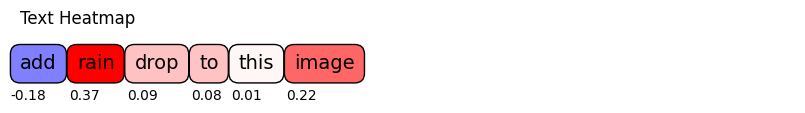

In [50]:
def plot_text_heatmap(words, scores, title="", width=10, height=0.4, verbose=0, max_word_per_line=20, word_spacing=20, score_fontsize=10, save_path=None):
    fig = plt.figure(figsize=(width, height))
    ax = plt.gca()
    ax.set_title(title, loc='left')
    cmap = plt.cm.ScalarMappable(cmap=plt.cm.bwr)
    cmap.set_clim(0, 1)
    canvas = ax.figure.canvas
    t = ax.transData
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    loc_y = -0.2
    for i, (token, score) in enumerate(zip(words, scores)):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = '#%02x%02x%02x' % tuple(rgb)
        text = ax.text(0.0, loc_y, token, bbox={'facecolor': color, 'pad': 5.0, 'linewidth': 1, 'boxstyle': 'round,pad=0.5'}, transform=t, fontsize=14)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        score_text = ax.text(0.01, loc_y - 1, f"{score:.2f}", transform=t, fontsize=score_fontsize, ha='center')
        score_text.draw(canvas.get_renderer())
        ex_score = score_text.get_window_extent()
        if (i+1) % max_word_per_line == 0:
            loc_y = loc_y - 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + word_spacing, units='dots')
    if verbose == 0:
        ax.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()
    words = prompt.split(' ')
# Define the save path for Kaggle output
save_path = save_path = 'D:\\my project\\stability\\res\\text_heatmap.png'


# Call the function with the save_path
plot_text_heatmap(words, coefficients, title="Text Heatmap", save_path=save_path)